In [6]:
import stanza

# Türkçe için stanza modelini indirin
stanza.download('tr')

# stanza modelini yükleyin
nlp = stanza.Pipeline('tr')

# Yer adlarını içeren bir metin örneği
text = "Bu metin İstanbul'da yaşayan bir kişinin deneyimlerini anlatıyor."

# NER ile metinden isimleri çıkarın
doc = nlp(text)

# Yer adlarını belirle
places = set()
for ent in doc.ents:
    if ent.type == 'GPE':
        places.add(ent.text)

print(places)


2023-07-11 02:34:00 INFO: Downloading default packages for language: tr (Turkish) ...
2023-07-11 02:34:01 INFO: File exists: /Users/alperendavran/stanza_resources/tr/default.zip
2023-07-11 02:34:04 INFO: Finished downloading models and saved to /Users/alperendavran/stanza_resources.
2023-07-11 02:34:04 INFO: Checking for updates to resources.json in case models have been updated.  Note: this behavior can be turned off with download_method=None or download_method=DownloadMethod.REUSE_RESOURCES
2023-07-11 02:34:05 INFO: Loading these models for language: tr (Turkish):
| Processor    | Package  |
---------------------------
| tokenize     | imst     |
| mwt          | imst     |
| pos          | imst     |
| lemma        | imst     |
| constituency | starlang |
| depparse     | imst     |
| ner          | starlang |

2023-07-11 02:34:05 INFO: Using device: cpu
2023-07-11 02:34:05 INFO: Loading: tokenize
2023-07-11 02:34:05 INFO: Loading: mwt
2023-07-11 02:34:05 INFO: Loading: pos
2023-07-

set()


In [2]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import folium
import json
import random

from sklearn.preprocessing import MinMaxScaler
from sklearn.preprocessing import LabelEncoder
from sklearn.model_selection import train_test_split
from sklearn.ensemble import RandomForestClassifier
from sklearn.metrics import accuracy_score, classification_report
from sklearn.metrics import f1_score
from sklearn.linear_model import LogisticRegression
from sklearn.naive_bayes import MultinomialNB

import keras
from keras.datasets import cifar10
from keras.models import Sequential
from keras.layers import Dense, Dropout, Conv2D, MaxPooling2D, Flatten
from keras.optimizers import Adam, SGD

# Quick Sanity Check

![Alt text](config\\check.jpg)

In [39]:
df = pd.read_csv("/Users/alperendavran/Desktop/Turkish_MP_Prediction-master/output.csv", sep=';')
df.head()


,NAME,TERM,PARTY,CITY,KANUN_TEKLIF_ILK,KANUN_TEKLIF,SORU_ONERGELERI_YAZILI,SORU_ONERGELERI_SOZLU,GENEL_GORUSME_ILK,GENEL_GORUSME,MEC_SORUSTURMA_ILK,MEC_SORUSTURMA,MEC_ARASTIRMA_ILK,MEC_ARASTIRMA,GENSORU_ILK,GENSORU,AGE
0,Aydın USLUPEHLİVAN,26,CHP,ADANA,2,35,6,0,1,1,0,0,4,102,0,0,61.0
1,Elif Doğan TÜRKMEN,26,CHP,ADANA,25,80,238,11,3,3,0,0,44,403,0,0,53.0
2,Fatma Güldemet SARI,26,AK PARTİ,ADANA,0,3,0,0,0,0,0,0,0,1,0,0,45.0
3,İbrahim ÖZDİŞ,26,CHP,ADANA,3,47,180,0,5,5,0,0,5,449,0,0,59.0
4,Mehmet Şükrü ERDİNÇ,26,AK PARTİ,ADANA,0,4,0,0,0,0,0,0,0,1,0,0,39.0


##### A color scheme for the political parties for later use. Also, political stances must be manually entered. Ruling and allied info should be manually entered also.

In [53]:
party_stance = {
    'AK PARTİ': 'Right',
    'CHP': 'Left',
    'İYİ PARTİ': 'Right',
    'MHP': 'Right',
    'HDP': 'Left',
    'DSP': 'Left',
    'BBP': 'Right',
    'BDP': 'Left',
    'TP': 'Right',
    'ANAPARTİ': 'Left',
    'E-PARTİ': 'Left',
    'DBP': 'Left',
    'KADEP': 'Left',
    'MEP': 'Left',
    'MİLAD': 'Right',
    'BAĞIMSIZ': 'Independent',
    'ANAP': 'Right',
    'DYP': 'Right',
    'TİP': 'Left',
    'SHP': 'Left',
    'GENÇPARTİ': 'Centrist',
    'HYP': 'Left',
    'DP': 'Right',
    'YENİLİK P': 'Left',
    'DEVA': 'Right',
    'ZAFER P': 'Right',
    'MEMLEKET P': 'Centrist',
    'SAADET P': 'Right',
}

colors = {
    'AK PARTİ': 'yellow',
    'CHP': 'red',
    'İYİ PARTİ': 'blue',
    'MHP': 'maroon',
    'HDP': 'purple',
    'BDP': 'purple',
    'BAĞIMSIZ': 'gray'
}

ruling_and_allies = {
    22: ['AK PARTİ'],
    23: ['AK PARTİ'],
    24: ['AK PARTİ'],
    25: ['AK PARTİ'],
    26: ['AK PARTİ', 'MHP'],  
    27: ['AK PARTİ', 'MHP']   
}

Color

In [6]:
def random_color():
    return "#"+''.join([random.choice('0123456789ABCDEF') for _ in range(6)])

for party in df["PARTY"].unique():
    if party not in colors.keys():
        colors[party] = random_color()

Affiliation

In [8]:
df["PARTY"].unique()

array(['CHP', 'AK PARTİ', 'HDP', 'MHP', 'BAĞIMSIZ', 'İYİ PARTİ', 'DSP',
       'BDP', 'BBP', 'TP', 'ANAP', 'DYP', 'SHP', 'GENÇPARTİ', 'HYP', 'DP',
       'YENİLİK P', 'DBP', 'TİP', 'DEVA', 'ZAFER P', 'MEMLEKET P',
       'SAADET P', 'ANAPARTİ', 'E-PARTİ', 'KADEP', 'MEP', 'MİLAD'],
      dtype=object)

# Data Cleaning

![Alt text](config\\clean.jpg)

##### First of all, we need to do some cleaning. Cleaning is very important in religion and also it leads to a healthier life.

In [9]:
df.loc[df.duplicated() == True].head()

,NAME,TERM,PARTY,CITY,KANUN_TEKLIF_ILK,KANUN_TEKLIF,SORU_ONERGELERI_YAZILI,SORU_ONERGELERI_SOZLU,GENEL_GORUSME_ILK,GENEL_GORUSME,MEC_SORUSTURMA_ILK,MEC_SORUSTURMA,MEC_ARASTIRMA_ILK,MEC_ARASTIRMA,GENSORU_ILK,GENSORU,AGE


##### As it can be seen from above cell, there are no duplicates to be dealt with within the dataframe. This is good news because this also indicates that our data collection have been clean.

##### Now, we should check for NULL entries within the dataframe, and fill them with appropriate numbers.

In [10]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 3339 entries, 0 to 3338
Data columns (total 17 columns):
 #   Column                  Non-Null Count  Dtype  
---  ------                  --------------  -----  
 0   NAME                    3339 non-null   object 
 1   TERM                    3339 non-null   int64  
 2   PARTY                   3339 non-null   object 
 3   CITY                    3339 non-null   object 
 4   KANUN_TEKLIF_ILK        3339 non-null   int64  
 5   KANUN_TEKLIF            3339 non-null   int64  
 6   SORU_ONERGELERI_YAZILI  3339 non-null   int64  
 7   SORU_ONERGELERI_SOZLU   3339 non-null   int64  
 8   GENEL_GORUSME_ILK       3339 non-null   int64  
 9   GENEL_GORUSME           3339 non-null   int64  
 10  MEC_SORUSTURMA_ILK      3339 non-null   int64  
 11  MEC_SORUSTURMA          3339 non-null   int64  
 12  MEC_ARASTIRMA_ILK       3339 non-null   int64  
 13  MEC_ARASTIRMA           3339 non-null   int64  
 14  GENSORU_ILK             3339 non-null   

# Preliminary Analysis

##### Here, we can investigate the overall structure of the dataset and gain some insights.

In [12]:
print("The number of the rows is " + str(df.shape[0]) + ".")
print("The number of the columns is " + str(df.shape[1]) + ".")

The number of the rows is 3339.
The number of the columns is 17.


In [13]:
df.info

<bound method DataFrame.info of                      NAME  TERM     PARTY       CITY  KANUN_TEKLIF_ILK  \
0      Aydın USLUPEHLİVAN    26       CHP      ADANA                 2   
1      Elif Doğan TÜRKMEN    26       CHP      ADANA                25   
2     Fatma Güldemet SARI    26  AK PARTİ      ADANA                 0   
3           İbrahim ÖZDİŞ    26       CHP      ADANA                 3   
4     Mehmet Şükrü ERDİNÇ    26  AK PARTİ      ADANA                 0   
...                   ...   ...       ...        ...               ...   
3334      Faruk ÇATUROĞLU    25  AK PARTİ  ZONGULDAK                 0   
3335      Hüseyin ÖZBAKIR    25  AK PARTİ  ZONGULDAK                 0   
3336    Şerafettin TURPCU    25       CHP  ZONGULDAK                 0   
3337        Ünal DEMİRTAŞ    25       CHP  ZONGULDAK                 0   
3338           Zeki ÇAKAN    25       MHP  ZONGULDAK                 0   

      KANUN_TEKLIF  SORU_ONERGELERI_YAZILI  SORU_ONERGELERI_SOZLU  \
0         

In [615]:
df.describe()

,TERM,KANUN_TEKLIF_ILK,KANUN_TEKLIF,SORU_ONERGELERI_YAZILI,SORU_ONERGELERI_SOZLU,GENEL_GORUSME_ILK,GENEL_GORUSME,MEC_SORUSTURMA_ILK,MEC_SORUSTURMA,MEC_ARASTIRMA_ILK,MEC_ARASTIRMA,GENSORU_ILK,GENSORU
count,3339.000000,3339.000000,3339.000000,3339.000000,3339.000000,3339.000000,3339.000000,3339.000000,3339.000000,3339.000000,3339.000000,3339.000000,3339.000000
mean,24.532195,4.336029,16.359090,65.044325,4.123390,1.033842,1.033842,0.008685,0.560347,4.470201,96.291105,0.027553,0.346511
std,1.723493,18.822521,29.808046,386.236696,55.722503,3.446118,3.446118,0.143512,1.583372,16.099300,223.245182,0.385268,1.242845
min,22.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
25%,23.000000,0.000000,3.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,2.000000,0.000000,0.000000
50%,25.000000,0.000000,8.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,9.000000,0.000000,0.000000
75%,26.000000,3.000000,20.000000,25.000000,0.000000,1.000000,1.000000,0.000000,0.000000,2.000000,69.000000,0.000000,0.000000
max,27.000000,517.000000,882.000000,10037.000000,2293.000000,44.000000,44.000000,4.000000,11.000000,375.000000,2186.000000,12.000000,13.000000


### There were,

* 550 deputies in 22th installment,
* 550 deputies in 23th installment,
* 550 deputies in 24th installment,
* 550 deputies in 25th installment,
* 550 deputies in 26th installment,
* 600 deputies in 27th installment.

### While this is a good measure to check for data completion, we had issues loading some of the pages.
### This was due to the fact that these pages were being updated by the webmasters at the time we were scraping.
### These pages were listed as "None" by the parser.

In [14]:
for i in range(6):
    if i == 5:
        count = (df["TERM"] == 27).sum()
        print("Among 600 deputies, " + str(count) + " were parsed from the TBMM website.")
    else:
        count = (df["TERM"] == 22 + i).sum()
        print("Among 550 deputies, " + str(count) + " were parsed from the TBMM website.")

Among 550 deputies, 552 were parsed from the TBMM website.
Among 550 deputies, 550 were parsed from the TBMM website.
Among 550 deputies, 546 were parsed from the TBMM website.
Among 550 deputies, 547 were parsed from the TBMM website.
Among 550 deputies, 548 were parsed from the TBMM website.
Among 600 deputies, 596 were parsed from the TBMM website.


# Exploratory Data Analysis

![Alt text](config\\eda.jpg)

Caption: Turkish National Grand Assembly. 

##### We can add a new column called "INCUMBENT" to the dataframe. This can indicate whether the political party of the deputy either makes up the government or is allied with the ruling party.

In [617]:
def is_incumbent(row):
    term = row['TERM']
    party = row['PARTY']
    return party in ruling_and_allies.get(term, [])

df['INCUMBENT'] = df.apply(is_incumbent, axis=1)
df.head()

,NAME,TERM,PARTY,CITY,KANUN_TEKLIF_ILK,KANUN_TEKLIF,SORU_ONERGELERI_YAZILI,SORU_ONERGELERI_SOZLU,GENEL_GORUSME_ILK,GENEL_GORUSME,MEC_SORUSTURMA_ILK,MEC_SORUSTURMA,MEC_ARASTIRMA_ILK,MEC_ARASTIRMA,GENSORU_ILK,GENSORU,INCUMBENT
0,Abdullah ÇALIŞKAN,22,AK PARTİ,ADANA,1,10,0,0,0,0,0,4,0,9,0,0,True
1,Abdullah TORUN,22,AK PARTİ,ADANA,0,16,0,1,0,0,0,0,0,11,0,0,True
2,Ali KÜÇÜKAYDIN,22,AK PARTİ,ADANA,1,17,0,0,0,0,0,0,0,14,0,0,True
3,Atilla BAŞOĞLU,22,AK PARTİ,ADANA,41,57,444,73,1,1,0,4,9,39,0,0,True
4,Ayhan Zeynep TEKİN BÖRÜ,22,AK PARTİ,ADANA,3,14,4,1,0,0,0,0,1,14,0,0,True


In [15]:
# First, we need to ensure 'AGE' column is numeric
df['AGE'] = pd.to_numeric(df['AGE'], errors='coerce')

# Let's look at the correlation matrix
correlation = df.corr()

# Let's see the correlation of AGE with other columns
age_correlation = correlation['AGE']
print(age_correlation)


TERM                      0.058530
KANUN_TEKLIF_ILK          0.028267
KANUN_TEKLIF              0.009849
SORU_ONERGELERI_YAZILI    0.016483
SORU_ONERGELERI_SOZLU     0.043958
GENEL_GORUSME_ILK         0.057287
GENEL_GORUSME             0.057287
MEC_SORUSTURMA_ILK        0.009793
MEC_SORUSTURMA            0.082495
MEC_ARASTIRMA_ILK         0.002726
MEC_ARASTIRMA             0.022444
GENSORU_ILK               0.003017
GENSORU                   0.061449
AGE                       1.000000
Name: AGE, dtype: float64


/var/folders/ps/nytksd614vxcr3ddmbzn5pzm0000gn/T/ipykernel_5565/264804981.py:5: FutureWarning: The default value of numeric_only in DataFrame.corr is deprecated. In a future version, it will default to False. Select only valid columns or specify the value of numeric_only to silence this warning.
  correlation = df.corr()


        PARTY  TERM        AGE
0    AK PARTİ    22  46.815126
1    AK PARTİ    23  49.325373
2    AK PARTİ    24  48.631746
3    AK PARTİ    25  49.356863
4    AK PARTİ    26  50.117460
5    AK PARTİ    27  49.945392
6         CHP    22  51.379085
7         CHP    23  55.495146
8         CHP    24  52.759690
9         CHP    25  50.885496
10        CHP    26  51.015152
11        CHP    27  51.604317
12        HDP    24  47.931034
13        HDP    25  46.800000
14        HDP    26  45.724138
15        HDP    27  47.245902
16        MHP    23  52.202703
17        MHP    24  54.098039
18        MHP    25  53.063291
19        MHP    26  54.000000
20        MHP    27  51.166667
21  İYİ PARTİ    26  55.500000
22  İYİ PARTİ    27  58.750000


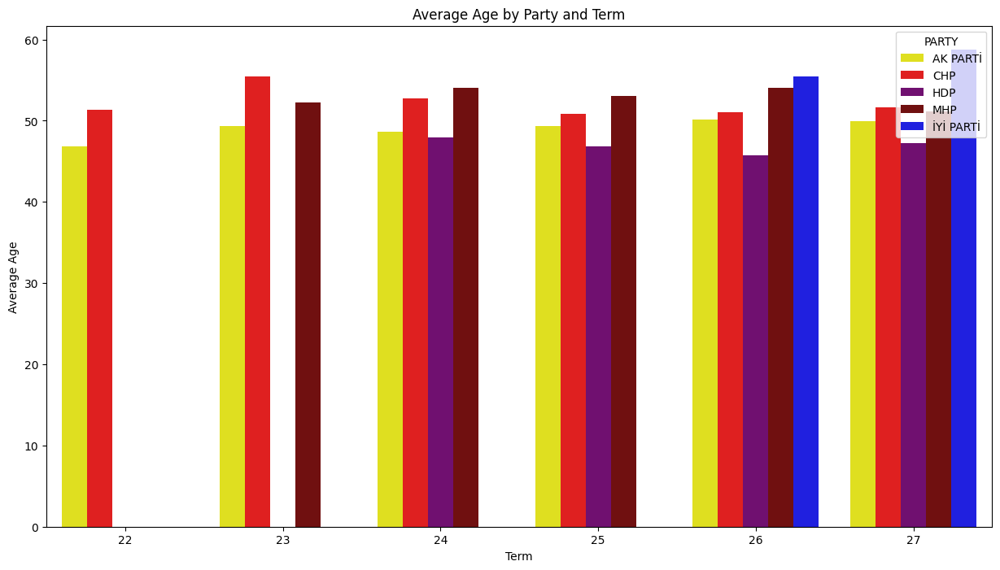

In [59]:
# Define the parties you're interested in
parties = ['AK PARTİ', 'CHP', 'İYİ PARTİ', 'MHP', 'HDP']

# Filter the DataFrame
filtered_df = df[df['PARTY'].isin(parties)]

# Group by party and term, and calculate average age
grouped_df = filtered_df.groupby(['PARTY', 'TERM'])['AGE'].mean().reset_index()
print(grouped_df)
# Create the plot
plt.figure(figsize=(15, 8))
sns.barplot(x='TERM', y='AGE', hue='PARTY', data=grouped_df, palette=colors)

plt.title('Average Age by Party and Term')
plt.xlabel('Term')
plt.ylabel('Average Age')

plt.show()




##### We can also add a new data row called "AFFILIATION". This should tell the political stance of the deputy depending on the political party. 

In [64]:
df['AFFILIATION'] = df['PARTY'].map(party_stance)
df.head()

,NAME,TERM,PARTY,CITY,KANUN_TEKLIF_ILK,KANUN_TEKLIF,SORU_ONERGELERI,GENEL_GORUSME_ILK,GENEL_GORUSME,MEC_SORUSTURMA_ILK,MEC_SORUSTURMA,MEC_ARASTIRMA_ILK,MEC_ARASTIRMA,AGE,TOTAL_ACTIVITY,AFFILIATION
0,Aydın USLUPEHLİVAN,26,CHP,ADANA,2,35,6,1,1,0,0,4,102,61.0,144,Left
1,Elif Doğan TÜRKMEN,26,CHP,ADANA,25,80,249,3,3,0,0,44,403,53.0,735,Left
2,Fatma Güldemet SARI,26,AK PARTİ,ADANA,0,3,0,0,0,0,0,0,1,45.0,4,Right
3,İbrahim ÖZDİŞ,26,CHP,ADANA,3,47,180,5,5,0,0,5,449,59.0,681,Left
4,Mehmet Şükrü ERDİNÇ,26,AK PARTİ,ADANA,0,4,0,0,0,0,0,0,1,39.0,5,Right


##### The 27th term and the later terms will not have "Interpellations" (gensoru) or "verbal parliementary questions" (sözlü soru önergesi). Therefore, It can be said that GENSORU data is irrelevant. Those columns can be dropped. For the case of "verbal parliementary questions, this can be done in order to preserve the dignity of the dataset.
 
  Let's,
* Add the verbal parliementary question counts to written parliementary question columns.
* Drop the verbal parliementary column.
* Rename the written parliementary questions column to just parliementary questions.

In [61]:
df['SORU_ONERGELERI_YAZILI'] += df['SORU_ONERGELERI_SOZLU']
df = df.drop(columns=['SORU_ONERGELERI_SOZLU'])
df = df.rename(columns={'SORU_ONERGELERI_YAZILI': 'SORU_ONERGELERI'})

df = df.drop(columns=['GENSORU_ILK'])
df = df.drop(columns=['GENSORU'])

df.head()

,NAME,TERM,PARTY,CITY,KANUN_TEKLIF_ILK,KANUN_TEKLIF,SORU_ONERGELERI,GENEL_GORUSME_ILK,GENEL_GORUSME,MEC_SORUSTURMA_ILK,MEC_SORUSTURMA,MEC_ARASTIRMA_ILK,MEC_ARASTIRMA,AGE
0,Aydın USLUPEHLİVAN,26,CHP,ADANA,2,35,6,1,1,0,0,4,102,61.0
1,Elif Doğan TÜRKMEN,26,CHP,ADANA,25,80,249,3,3,0,0,44,403,53.0
2,Fatma Güldemet SARI,26,AK PARTİ,ADANA,0,3,0,0,0,0,0,0,1,45.0
3,İbrahim ÖZDİŞ,26,CHP,ADANA,3,47,180,5,5,0,0,5,449,59.0
4,Mehmet Şükrü ERDİNÇ,26,AK PARTİ,ADANA,0,4,0,0,0,0,0,0,1,39.0


/var/folders/ps/nytksd614vxcr3ddmbzn5pzm0000gn/T/ipykernel_5565/13008683.py:12: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_filtered['AgeGroup'] = pd.cut(df_filtered['AGE'], bins=bins, labels=labels)
/var/folders/ps/nytksd614vxcr3ddmbzn5pzm0000gn/T/ipykernel_5565/13008683.py:42: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout()


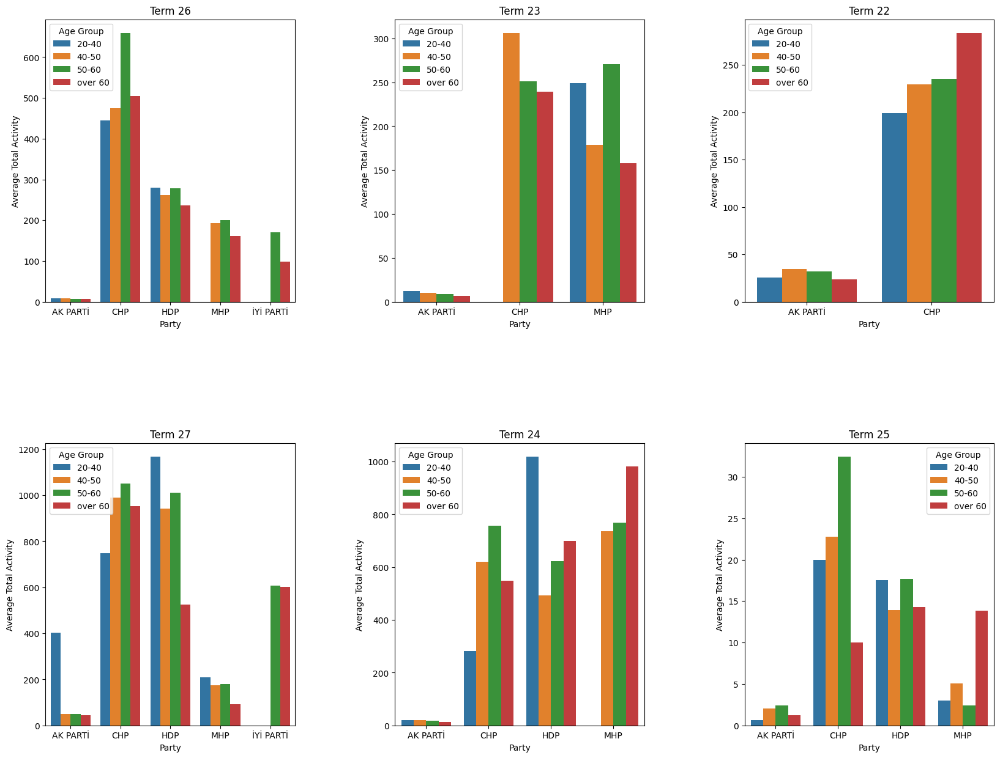

In [72]:
# Define the parties of interest
parties = ['AK PARTİ', 'CHP', 'İYİ PARTİ', 'MHP', 'HDP']

# Filter the DataFrame for only the defined parties
df_filtered = df[df['PARTY'].isin(parties)]

# Define age bins and labels
bins = [0, 35, 45, 55, np.inf]
labels = ['20-40', '40-50', '50-60', 'over 60']

# Create a new column 'AgeGroup' by categorizing 'AGE' column using the defined bins and labels
df_filtered['AgeGroup'] = pd.cut(df_filtered['AGE'], bins=bins, labels=labels)

# Group by 'PARTY', 'TERM' and 'AgeGroup', and calculate average 'TOTAL_ACTIVITY' for each group
grouped = df_filtered.groupby(['PARTY', 'TERM', 'AgeGroup'])['TOTAL_ACTIVITY'].mean().reset_index()

# Set the figure size and the grid
plt.figure(figsize=(20, 15))
grid = plt.GridSpec(2, 3, hspace=0.5, wspace=0.4)

# Get unique terms
terms = df_filtered['TERM'].unique()

# Create a subplot for each term
for i, term in enumerate(terms):
    ax = plt.subplot(grid[i//3, i%3])
    
    # Filter data for the term
    df_term = df_filtered[df_filtered['TERM'] == term]
    
    # Group by 'PARTY' and 'AgeGroup', and calculate average 'TOTAL_ACTIVITY' for each group
    grouped_term = df_term.groupby(['PARTY', 'AgeGroup'])['TOTAL_ACTIVITY'].mean().reset_index()

    # Create a bar plot
    sns.barplot(x='PARTY', y='TOTAL_ACTIVITY', hue='AgeGroup', data=grouped_term, ax=ax)
    ax.set_title('Term {}'.format(term))
    ax.set_xlabel('Party')
    ax.set_ylabel('Average Total Activity')
    ax.legend(title='Age Group')

# Show the plots
plt.tight_layout()
plt.show()

##### Yet ANOTHER column named "TOTAL_ACTIVITY". This should be helpful in terms of creating K-Nearest Neighbors (KNN) models because of the Dimension's Curse. Also, localized discrepancies may be culled. For example, if some deputy is changing the overall mean of the opposition, his/her party; he/she may be dropped from the dataframe.

In [73]:
df["TOTAL_ACTIVITY"] = df["KANUN_TEKLIF"] + df["SORU_ONERGELERI"] + df["GENEL_GORUSME"] + df["MEC_SORUSTURMA"] + df["MEC_ARASTIRMA"]
cols = df.columns.tolist()
cols = cols[:4] + [cols[15]] + cols[4:]
df = df[cols]

df = df.iloc[:, :-1]

df.head()

,NAME,TERM,PARTY,CITY,AFFILIATION,KANUN_TEKLIF_ILK,KANUN_TEKLIF,SORU_ONERGELERI,GENEL_GORUSME_ILK,GENEL_GORUSME,MEC_SORUSTURMA_ILK,MEC_SORUSTURMA,MEC_ARASTIRMA_ILK,MEC_ARASTIRMA,AGE,TOTAL_ACTIVITY
0,Aydın USLUPEHLİVAN,26,CHP,ADANA,Left,2,35,6,1,1,0,0,4,102,61.0,144
1,Elif Doğan TÜRKMEN,26,CHP,ADANA,Left,25,80,249,3,3,0,0,44,403,53.0,735
2,Fatma Güldemet SARI,26,AK PARTİ,ADANA,Right,0,3,0,0,0,0,0,0,1,45.0,4
3,İbrahim ÖZDİŞ,26,CHP,ADANA,Left,3,47,180,5,5,0,0,5,449,59.0,681
4,Mehmet Şükrü ERDİNÇ,26,AK PARTİ,ADANA,Right,0,4,0,0,0,0,0,0,1,39.0,5


In [40]:
# Filter the DataFrame
young_members = df[df['AGE'] < 24]

# Print the result
print(young_members)


               NAME  TERM     PARTY        CITY  KANUN_TEKLIF_ILK  \
1821     Dersim DAĞ    27       HDP  DİYARBAKIR                12   
1975  Rümeysa KADAK    27  AK PARTİ    İSTANBUL                 0   

      KANUN_TEKLIF  SORU_ONERGELERI_YAZILI  SORU_ONERGELERI_SOZLU  \
1821            13                     404                      0   
1975            47                       0                      0   

      GENEL_GORUSME_ILK  GENEL_GORUSME  MEC_SORUSTURMA_ILK  MEC_SORUSTURMA  \
1821                  1              1                   0               0   
1975                  0              0                   0               0   

      MEC_ARASTIRMA_ILK  MEC_ARASTIRMA  GENSORU_ILK  GENSORU   AGE  
1821                 36            830            0        0  22.0  
1975                  1             34            0        0  22.0  


##### There could be some discrepancies with the data. In order to isolate the possible problematic deputies, we might as well list them and compare with its own group. Here, we can see that the total activity of one of the deputies of Niğde is astoundingly high. We should investigate this city. 

In [621]:
value = df.loc[df["NAME"] == "Ömer Fethi GÜRER"]
print(value)

                  NAME  TERM PARTY   CITY  TOTAL_ACTIVITY  KANUN_TEKLIF_ILK   
2648  Ömer Fethi GÜRER    26   CHP  NİĞDE            6411               122  \
3238  Ömer Fethi GÜRER    27   CHP  NİĞDE            7449               257   

      KANUN_TEKLIF  SORU_ONERGELERI  GENEL_GORUSME_ILK  GENEL_GORUSME   
2648           173             5230                  8              8  \
3238           449             4791                 23             23   

      MEC_SORUSTURMA_ILK  MEC_SORUSTURMA  MEC_ARASTIRMA_ILK  MEC_ARASTIRMA   
2648                   0               0                184           1000  \
3238                   0               0                375           2186   

      INCUMBENT AFFILIATION  
2648      False        Left  
3238      False        Left  


In [622]:
active = df.groupby('CITY')['TOTAL_ACTIVITY'].mean().sort_values(ascending = False)
active.head(5)

CITY
ARDAHAN       1105.916667
NİĞDE          856.222222
KIRKLARELİ     385.444444
IĞDIR          342.000000
ARTVİN         323.500000
Name: TOTAL_ACTIVITY, dtype: float64

In [623]:
nigde_active = df.loc[df["CITY"] == "NİĞDE"].groupby("NAME")["TOTAL_ACTIVITY"].sum().sort_values(ascending = False)
nigde_active.head()

NAME
Ömer Fethi GÜRER    13860
Doğan ŞAFAK           522
Orhan ERASLAN         384
Mümin İNAN            303
Selim GÜLTEKİN        121
Name: TOTAL_ACTIVITY, dtype: int64

In [624]:
ardahan_active = df.loc[df["CITY"] == "ARDAHAN"].groupby("NAME")["TOTAL_ACTIVITY"].sum().sort_values(ascending = False)
ardahan_active.head()

NAME
Ensar ÖĞÜT       13107
Öztürk YILMAZ       90
Orhan ATALAY        44
Kenan ALTUN         24
Saffet KAYA          5
Name: TOTAL_ACTIVITY, dtype: int64

In [625]:
ardahan_active = df.loc[df["CITY"] == "KÜTAHYA"].groupby("NAME")["TOTAL_ACTIVITY"].sum().sort_values(ascending = False)
ardahan_active.head()

NAME
Alim IŞIK              7297
Ali Fazıl KASAP        1064
Ahmet ERBAŞ             166
Ceyda ÇETİN ERENLER      87
İdris BAL                62
Name: TOTAL_ACTIVITY, dtype: int64

In [626]:
igdir_active = df.loc[df["CITY"] == "IĞDIR"].groupby("NAME")["TOTAL_ACTIVITY"].sum().sort_values(ascending = False)
igdir_active.head()

NAME
Pervin BULDAN           1360
Habip EKSİK              943
Sinan OĞAN               697
Dursun AKDEMİR           426
Mehmet Emin ADIYAMAN     316
Name: TOTAL_ACTIVITY, dtype: int64

In [627]:
df = df.loc[df["NAME"] != "Ensar ÖĞÜT"]
active = df.groupby("CITY")["TOTAL_ACTIVITY"].mean().sort_values(ascending = False)
active.head()

CITY
NİĞDE         856.222222
KIRKLARELİ    385.444444
IĞDIR         342.000000
ARTVİN        323.500000
KÜTAHYA       301.266667
Name: TOTAL_ACTIVITY, dtype: float64

##### It is safe to drom them from the dataframe, even though it is evident that he is a hardworking politician. But in this case, he is disrupting the bigger picture with his work ethics. After his removal, the list looks somewhat better.

In [628]:
df = df.loc[df["NAME"] != "Ömer Fethi GÜRER"]
active = df.groupby("CITY")["TOTAL_ACTIVITY"].mean().sort_values(ascending = False)
active.head()

CITY
KIRKLARELİ    385.444444
IĞDIR         342.000000
ARTVİN        323.500000
KÜTAHYA       301.266667
TUNCELİ       299.916667
Name: TOTAL_ACTIVITY, dtype: float64

In [629]:
df = df.loc[df["NAME"] != "Alim IŞIK"]
active = df.groupby("CITY")["TOTAL_ACTIVITY"].mean().sort_values(ascending = False)
active.head()

CITY
KIRKLARELİ    385.444444
IĞDIR         342.000000
ARTVİN        323.500000
TUNCELİ       299.916667
ŞIRNAK        292.590909
Name: TOTAL_ACTIVITY, dtype: float64

# Data Visualization

![Alt text](config\\data_viz.png)

Caption: Ekrem İmamoğlu showing a visual statistic on national television during his debate with Binali Yıldırım, for 2019 Elections.

##### It is a good idea to investigate the changes in the deputy counts of the political parties. 

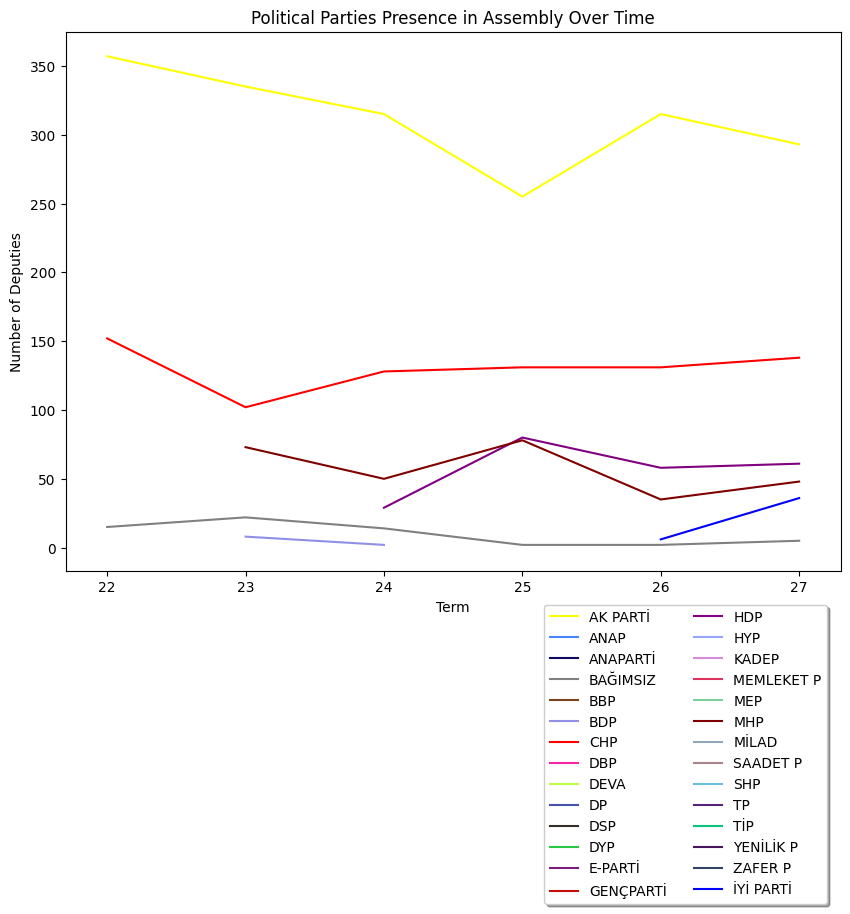

In [630]:
# Count occurrences of each party within each term
party_counts = df.groupby(['TERM', 'PARTY']).size().unstack()

# If party_counts is not empty, then plot
if not party_counts.empty:
    fig, ax = plt.subplots(figsize=(10,7))

    for party in party_counts.columns:
        if party in colors:  # Only plot for parties that are in our color dictionary
            ax.plot(party_counts.index, party_counts[party], label=party, color=colors[party])

    ax.set_xlabel('Term')
    ax.set_ylabel('Number of Deputies')
    ax.set_title('Political Parties Presence in Assembly Over Time')

    ax.xaxis.set_major_locator(plt.MaxNLocator(integer=True))  # Ensure only integers on x-axis
    ax.set_xlim(21.7, 27.3)  # Set limits for x-axis

    # Create a legend outside of the main plot
    ax.legend(loc='upper center', bbox_to_anchor=(0.80, -0.05), shadow=True, ncol=2)

    plt.show()
else:
    print("No data to plot. party_counts DataFrame is empty.")


##### We can investigate the changes in the activeness of political parties over time. Changes in the individual cities may also yield important data.

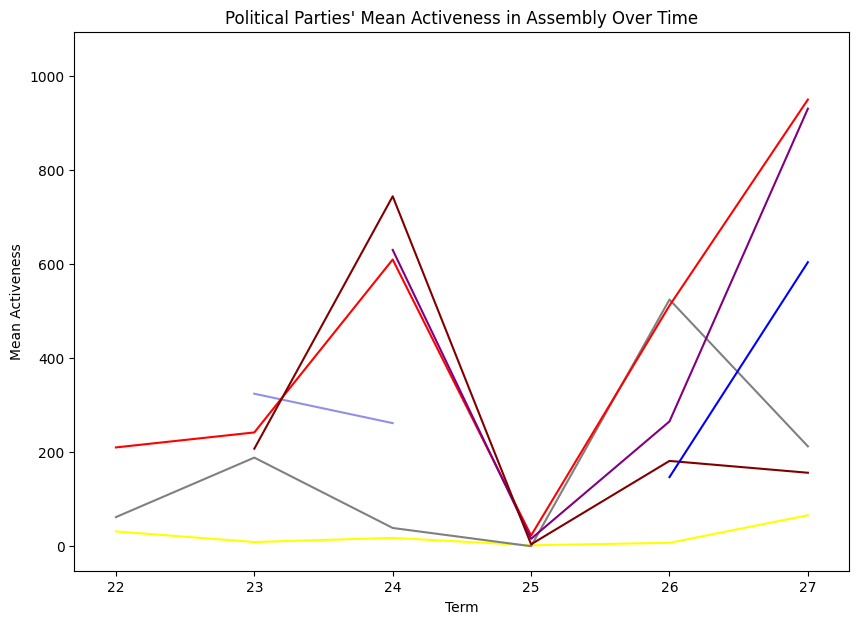

In [631]:
#--------------------------------------------------------------------
# Change this variable to see the whole country or individual cities.
# An input screen will show if the flag is set to "False".
# Data for the whole country will show if it is set to "True".

#########################
WHOLE_COUNTRY = True
#########################

#---------------------------------------------------------------------

# For input
turkish_map = {ord('i'): 'İ', ord('ı'): 'I', ord('ğ'): 'Ğ', ord('ş'): 'Ş', ord('ı'): 'I'}

if not WHOLE_COUNTRY:
    city = str(input("Please enter the city that you want to look into: "))
    city = city.translate(turkish_map).upper()
    df_plot = df[df['CITY'] == city]
else:
    df_plot = df
    
party_means = df_plot.groupby(['TERM', 'PARTY'])['TOTAL_ACTIVITY'].mean().unstack()

fig, ax = plt.subplots(figsize=(10,7))

for party in party_means.columns:
    if party in colors:  
        ax.plot(party_means.index, party_means[party], label=party, color=colors[party])

ax.set_xlabel('Term')
ax.set_ylabel('Mean Activeness')
ax.set_title('Political Parties\' Mean Activeness in Assembly Over Time')

ax.xaxis.set_major_locator(plt.MaxNLocator(integer=True))  
ax.set_xlim(21.7, 27.3)

#ax.legend(loc='upper center', bbox_to_anchor=(0.80, -0.05), shadow=True, ncol=2)

plt.show()

There are things that can be inferred from this graph: 
* Independents are very active. This could mean that due to lack of a corporate structure, they may think that their only way in stayin in the assembly is to work hard.
* There is a schism on the graph in the 25th term. 25th term was very short, and because of this, no activity may be inferred from this.
    * Therefore, before creating the models, the data pertaining to this term may be dropped.
* Ak Parti has the least active deputies. This may be attributed to the fact that they are the ruling party and that their deputies are not inclined or obliged to investigate their own political organization.

##### We can form a heatmap in form of a correlation matrix in order to see whether there are certain correlations in between different columns.

<Axes: >

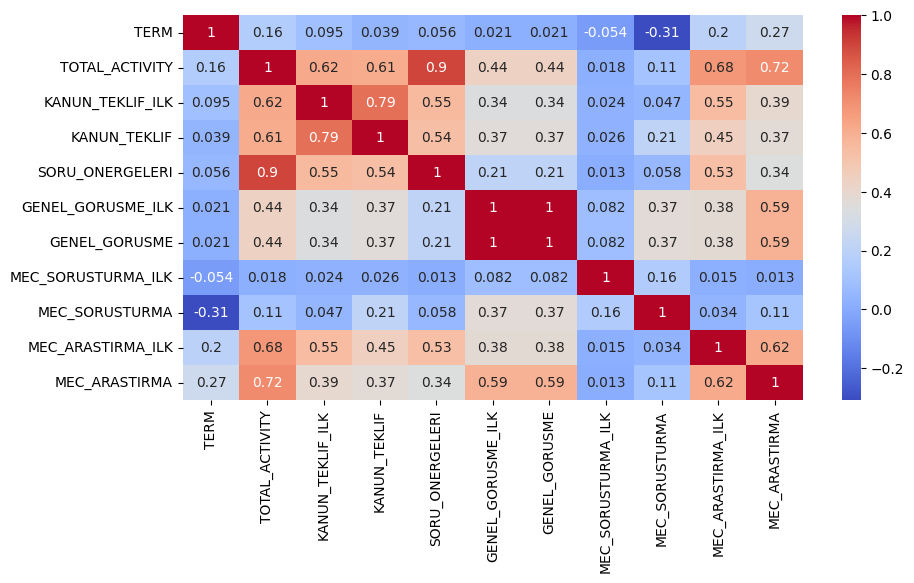

In [632]:
df_corr = df
df_corr = df_corr.drop(columns=["NAME", "PARTY", "CITY", "INCUMBENT", "AFFILIATION"])

correlation_matrix = df_corr.corr()
plt.figure(figsize=(10,5))
sns.heatmap(correlation_matrix, annot=True, cmap='coolwarm')

There are a lot of things to infer from this heatmap:
* There is a positive correlation between the "MEC_ARASTIRMA_ILK", "SORU_ONERGELERI" and "TOTAL_ACTIVITY". This indicates that
* There is no indication of a correlation between the "TERM" and "TOTAL_ACTIVITY". This means that there isn't an overall increase in the activism of politicians. 
* Also, there's high correlation between "SORU_ONERGELERI" and "TOTAL_ACTIVITY". This shows that the more a deputy asks parliementary questions, the more it is likely that he/she is also active in other things, such as parliementary investigations, etc.

##### What we can also do is to show the difference of activeness of cities' deputies with a political map of Türkiye.

In [633]:
with open('config\\turkey.geojson', 'r', encoding = "utf-8") as f:
    turkey_map = json.load(f)

turkish_map = {ord('i'): 'İ', ord('ı'): 'I', ord('ğ'): 'Ğ', ord('ş'): 'Ş', ord('ı'): 'I'}

for feature in turkey_map['features']:
    city_name = feature['properties']['shapeName']
    city_name_upper = city_name.translate(turkish_map).upper()

    if city_name_upper == "ISTANBUL":
        city_name_upper = "İSTANBUL"
    elif city_name_upper == "IZMİR":
        city_name_upper = "İZMİR"

    feature['properties']['shapeName'] = city_name_upper

city_stats = df.groupby('CITY')['TOTAL_ACTIVITY'].mean().reset_index()
m = folium.Map(location=[39.925533, 35.866287], zoom_start=7)

folium.Choropleth(
    geo_data=turkey_map,
    data=city_stats,
    columns=['CITY', 'TOTAL_ACTIVITY'],
    key_on='feature.properties.shapeName',
    fill_color='YlOrRd',
    fill_opacity=0.7,
    line_opacity=0.2,
    legend_name='Toplam İstatistikler'
).add_to(m)

m

# Predicting political affiliation using classification and ML

![Alt text](config\\machine_learning.jpg)

Caption: AI - Generated Image of Mustafa Kemal Atatürk as President of the contemporary Turkish Republic.

We will be evaluating for 3 things:
* Predictability of politial party of a deputy based on his/her activeness in the lawmaking process.
* Predictability of the political stance of a deputy based on his/her activeness in the lawmaking process.
* Predictability of whether the political party of the deputy is the ruling party or allied to the ruling party.

In [634]:
#--------------------------------------------------------------------
# Change this variable to drop 25th term deputies.
# This is a considerable action since there is a significant drop in activities in 25th term.

#########################
IS_25TH_INCLUDED = True
#########################

#---------------------------------------------------------------------

In [635]:
if IS_25TH_INCLUDED == False:
    df = df.loc[df["TERM"] != 25]

In [636]:
df["TERM"].unique()

array([22, 23, 24, 25, 26, 27], dtype=int64)

## 1. Political Party Prediction Based On Activeness

In [637]:
labels1 = df["PARTY"]
#df_train1 = pd.get_dummies(df, columns=["CITY"])
df_train1 = df

features1 = df_train1.drop(columns = ["CITY", "PARTY", "NAME", "TERM", "AFFILIATION", "INCUMBENT", "TOTAL_ACTIVITY"])
scaler = MinMaxScaler()
features1 = scaler.fit_transform(features1)
features_train1, features_test1, labels_train1, labels_test1 = train_test_split(features1, labels1, test_size=0.2, random_state=42)

##### Random Forest Classifier

In [638]:
rfc = RandomForestClassifier(n_estimators=100, random_state=42)
rfc.fit(features_train1, labels_train1)
labels_pred1_rfc = rfc.predict(features_test1)
f1 = f1_score(labels_test1, labels_pred1_rfc, average='micro')
print(f'F1 Score: {f1:.6f}')

F1 Score: 0.836582


##### Multilayer Perceptron

In [639]:
labels1_numeric = LabelEncoder().fit_transform(labels1)

model1 = Sequential()
model1.add(Dense(512, activation='relu', input_shape=(features_train1.shape[1],), name='hidden_layer1'))
model1.add(Dense(128, activation='relu', name='hidden_layer2'))
model1.add(Dense(28, activation='softmax', name='output_layer'))

model1.compile(loss='sparse_categorical_crossentropy', optimizer=Adam(), metrics=['accuracy'])
history1 = model1.fit(features1, labels1_numeric, batch_size=32, epochs=15, validation_split = 0.2, verbose=1)

Epoch 1/15
84/84 [==============================] - 1s 4ms/step - loss: 1.6965 - accuracy: 0.6558 - val_loss: 1.3903 - val_accuracy: 0.6867
Epoch 2/15
84/84 [==============================] - 0s 2ms/step - loss: 0.9848 - accuracy: 0.7080 - val_loss: 1.2211 - val_accuracy: 0.6882
Epoch 3/15
84/84 [==============================] - 0s 2ms/step - loss: 0.9280 - accuracy: 0.7237 - val_loss: 1.2171 - val_accuracy: 0.7181
Epoch 4/15
84/84 [==============================] - 0s 2ms/step - loss: 0.8892 - accuracy: 0.7451 - val_loss: 1.1628 - val_accuracy: 0.7031
Epoch 5/15
84/84 [==============================] - 0s 2ms/step - loss: 0.8542 - accuracy: 0.7571 - val_loss: 1.1608 - val_accuracy: 0.7301
Epoch 6/15
84/84 [==============================] - 0s 2ms/step - loss: 0.8307 - accuracy: 0.7669 - val_loss: 1.0713 - val_accuracy: 0.7676
Epoch 7/15
84/84 [==============================] - 0s 2ms/step - loss: 0.8001 - accuracy: 0.7729 - val_loss: 1.1886 - val_accuracy: 0.7046
Epoch 8/15
84/84 [==

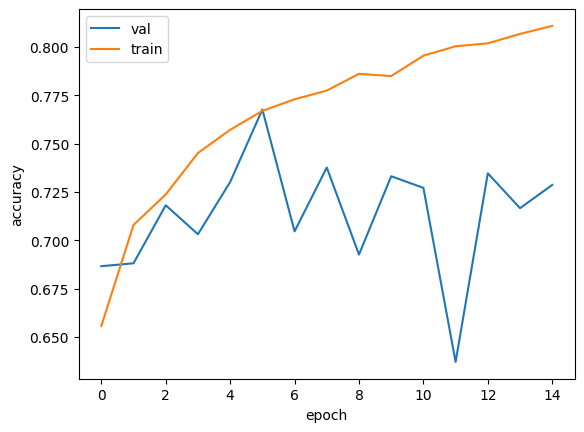

In [640]:
plt.plot(history1.history['val_accuracy'])
plt.plot(history1.history["accuracy"])
plt.ylabel('accuracy')
plt.xlabel('epoch')
plt.legend(['val', 'train'], loc='upper left')
plt.show()

##### Naive Bayes

In [641]:
from sklearn.linear_model import LogisticRegression
from sklearn.naive_bayes import MultinomialNB

naive_bayes = MultinomialNB().fit(features_train1, labels_train1)
labels_pred1_nb = naive_bayes.predict(features_test1)
print(accuracy_score(labels_test1, labels_pred1_nb))

logistic_regression = LogisticRegression().fit(features_train1, labels_train1)
labels_pred1_lr = logistic_regression.predict(features_test1)
print(accuracy_score(labels_test1, labels_pred1_lr))

0.5592203898050975
0.6746626686656672


## 2. Political Affiliation Prediction Based On Activeness

In [642]:
labels2 = df["AFFILIATION"]
#df_train2 = pd.get_dummies(df, columns=["CITY"])
df_train2 = df
features2 = df_train2.drop(columns = ["CITY", "PARTY", "NAME", "TERM", "AFFILIATION", "INCUMBENT", "TOTAL_ACTIVITY"])

scaler = MinMaxScaler()
features2 = scaler.fit_transform(features2)
features_train2, features_test2, labels_train2, labels_test2 = train_test_split(features2, labels2, test_size=0.2, random_state=42)

##### Random Forest Classifier

In [643]:
rfc = RandomForestClassifier(n_estimators=100, random_state=42)
rfc.fit(features_train2, labels_train2)
labels_pred2 = rfc.predict(features_test2)
f1 = f1_score(labels_test2, labels_pred2, average='micro')
print(f'F1 Score: {f1:.6f}')

F1 Score: 0.869565


##### Multilayer Perceptron

In [644]:
labels2_numeric = LabelEncoder().fit_transform(labels2)

model2 = Sequential()
model2.add(Dense(512, activation='relu', input_shape=(features_train1.shape[1],), name='hidden_layer1'))
model2.add(Dense(128, activation='relu', name='hidden_layer2'))
model2.add(Dense(28, activation='softmax', name='output_layer'))

model2.compile(loss='sparse_categorical_crossentropy', optimizer=Adam(), metrics=['accuracy'])
history2 = model2.fit(features2, labels2_numeric, batch_size=32, epochs=15, validation_split = 0.2, verbose=1)

Epoch 1/15
84/84 [==============================] - 1s 3ms/step - loss: 1.3884 - accuracy: 0.7260 - val_loss: 0.4615 - val_accuracy: 0.8276
Epoch 2/15
84/84 [==============================] - 0s 2ms/step - loss: 0.5584 - accuracy: 0.7875 - val_loss: 0.4652 - val_accuracy: 0.8516
Epoch 3/15
84/84 [==============================] - 0s 2ms/step - loss: 0.5489 - accuracy: 0.7909 - val_loss: 0.5050 - val_accuracy: 0.8486
Epoch 4/15
84/84 [==============================] - 0s 2ms/step - loss: 0.5489 - accuracy: 0.7950 - val_loss: 0.4720 - val_accuracy: 0.8516
Epoch 5/15
84/84 [==============================] - 0s 2ms/step - loss: 0.5415 - accuracy: 0.7995 - val_loss: 0.4963 - val_accuracy: 0.8456
Epoch 6/15
84/84 [==============================] - 0s 2ms/step - loss: 0.5355 - accuracy: 0.7999 - val_loss: 0.4423 - val_accuracy: 0.8516
Epoch 7/15
84/84 [==============================] - 0s 2ms/step - loss: 0.5303 - accuracy: 0.8063 - val_loss: 0.4418 - val_accuracy: 0.8441
Epoch 8/15
84/84 [==

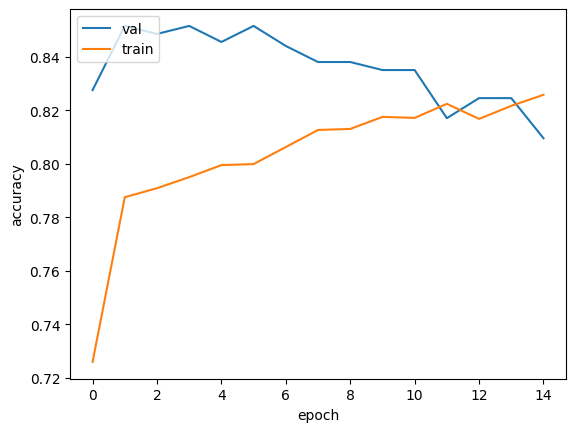

In [645]:
plt.plot(history2.history['val_accuracy'])
plt.plot(history2.history["accuracy"])
plt.ylabel('accuracy')
plt.xlabel('epoch')
plt.legend(['val', 'train'], loc='upper left')
plt.show()

##### Naive Bayes

In [646]:
naive_bayes = MultinomialNB().fit(features_train2, labels_train2)
labels_pred2_nb = naive_bayes.predict(features_test2)
print(accuracy_score(labels_test2, labels_pred2_nb))

logistic_regression = LogisticRegression().fit(features_train2, labels_train2)
labels_pred2_lr = logistic_regression.predict(features_test2)
print(accuracy_score(labels_test2, labels_pred2_lr))

0.6551724137931034
0.782608695652174


## 3. Political Power Prediction Based On Activeness

In [647]:
labels3 = df["INCUMBENT"]
#df = pd.get_dummies(df, columns=["CITY"])
df_train3 = df
features3 = df_train3.drop(columns = ["CITY", "PARTY", "NAME", "TERM", "INCUMBENT", "AFFILIATION", "TOTAL_ACTIVITY"])

scaler = MinMaxScaler()
features3 = scaler.fit_transform(features3)

features_train3, features_test3, labels_train3, labels_test3 = train_test_split(features3, labels3, test_size=0.2, random_state=42)

##### Random Forest Classifier

In [648]:
rfc = RandomForestClassifier(n_estimators=100, random_state=42)
rfc.fit(features_train3, labels_train3)
labels_pred3 = rfc.predict(features_test3)
f1 = f1_score(labels_test3, labels_pred3, average='micro')
print(f'F1 Score: {f1:.6f}')

F1 Score: 0.925037


##### Multilayer Perceptron

In [649]:
labels3_numeric = LabelEncoder().fit_transform(labels3)

model3 = Sequential()
model3.add(Dense(512, activation='relu', input_shape=(features_train1.shape[1],), name='hidden_layer1'))
model3.add(Dense(128, activation='relu', name='hidden_layer2'))
model3.add(Dense(28, activation='softmax', name='output_layer'))

model3.compile(loss='sparse_categorical_crossentropy', optimizer=Adam(), metrics=['accuracy'])
history3 = model3.fit(features3, labels3_numeric, batch_size=32, epochs=15, validation_split = 0.2, verbose=1)

Epoch 1/15
84/84 [==============================] - 1s 4ms/step - loss: 1.3498 - accuracy: 0.7177 - val_loss: 0.3876 - val_accuracy: 0.8996
Epoch 2/15
84/84 [==============================] - 0s 2ms/step - loss: 0.4952 - accuracy: 0.7823 - val_loss: 0.3482 - val_accuracy: 0.8936
Epoch 3/15
84/84 [==============================] - 0s 2ms/step - loss: 0.4687 - accuracy: 0.8022 - val_loss: 0.3755 - val_accuracy: 0.8936
Epoch 4/15
84/84 [==============================] - 0s 2ms/step - loss: 0.4684 - accuracy: 0.8044 - val_loss: 0.3677 - val_accuracy: 0.8921
Epoch 5/15
84/84 [==============================] - 0s 2ms/step - loss: 0.4561 - accuracy: 0.8112 - val_loss: 0.3838 - val_accuracy: 0.8981
Epoch 6/15
84/84 [==============================] - 0s 2ms/step - loss: 0.4515 - accuracy: 0.8161 - val_loss: 0.3238 - val_accuracy: 0.8981
Epoch 7/15
84/84 [==============================] - 0s 3ms/step - loss: 0.4491 - accuracy: 0.8119 - val_loss: 0.3892 - val_accuracy: 0.9025
Epoch 8/15
84/84 [==

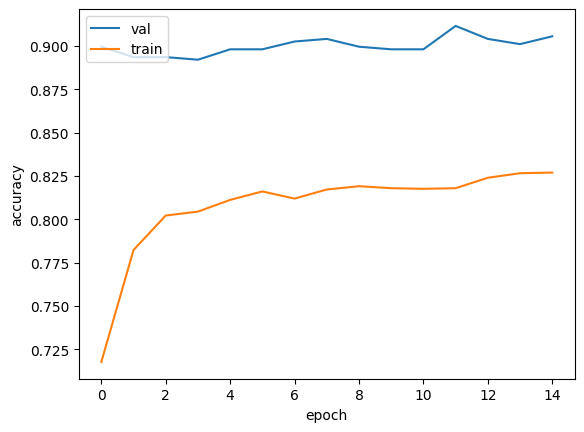

In [650]:
plt.plot(history3.history['val_accuracy'])
plt.plot(history3.history["accuracy"])
plt.ylabel('accuracy')
plt.xlabel('epoch')
plt.legend(['val', 'train'], loc='upper left')
plt.show()

##### Naive Bayes

In [651]:
naive_bayes = MultinomialNB().fit(features_train3, labels_train3)
labels_pred3_nb = naive_bayes.predict(features_test3)
print(accuracy_score(labels_test3, labels_pred3_nb))

logistic_regression = LogisticRegression().fit(features_train3, labels_train3)
labels_pred3_lr = logistic_regression.predict(features_test3)
print(accuracy_score(labels_test3, labels_pred3_lr))

0.616191904047976
0.7811094452773614
